In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.animation as animation
from IPython.display import HTML
from collections import Counter
from nltk.corpus import stopwords
import nltk

# Bar Chart Race in Python with Matplotlib and NLTK

Based on the Demo notebook, we want now to build a bar chart race by using other type of dataset, let's make it challenging! We will be using the [A Million News Headlines](https://www.kaggle.com/therohk/million-headlines) that you can find in [Kaggle](https://www.kaggle.com/)'s database. I have downloaded in store it in the `Dataset` folder for this project.

The data contains news headlines published over a period of 15 years (early 2003 - end 2017). We will be using both of the columns: `publish_date` (date of publishing for the article in yyyyMMdd format) and `headline_text` (text of the headline in Ascii). Total records: **1,103,663**.

Digging into the keywords, one can see all the important episodes shaping the last decade and how they evolved over time. Ex: financial crisis, iraq war, multiple US elections, ecological disasters, terrorism, famous people, Australian crimes, etc.

Our aim is to emulate a bar chart race that will give us the top 10 values by a given month and year, this is the top 10 most common words used headlines by month and year. We will be using the `nltk`([Natural Language Toolkit](https://www.nltk.org/)) with Python for this.

### Table of contents

* [Fetch data](#fetch)
* [Data transformations and basic chart](#transform)
* [Color and labels](#color)
* [Polish style](#style)
* [Animated race](#race)

## Fetch the data
<a id="fetch"></a>

We will read the headlines dataset with `pandas`, working with the two columns `publish_date` and `headline_text`, explained before.

In [2]:
# read the dataset
data = pd.read_csv('../Datasets/abcnews-date-text.csv')

# plot the first three entries of the dataset
data.head(3)

,publish_date,headline_text
0,20030219,aba decides against community broadcasting lic...
1,20030219,act fire witnesses must be aware of defamation
2,20030219,a g calls for infrastructure protection summit


## Data transformations and basic chart
<a id="transform"></a>

We want the top 10 values that are given in a specific month and year. Here, we will apply the `nltk` tools to uncover which words were mostly used on the different headlines. But first of all, we have to consider that in english language we have a set of stopwords that are commonly used and that are useless for our task, as they do not give any type of information and therefore we should remove.

Make sure you have installed the `nltk` package and if you have not downloaded the 'stopwords', please do.

In [3]:
# download nltk stopwords
nltk.download('stopwords')

# create stop_words variable
stop_words = stopwords.words('english')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\acoifman\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


We wil transform our data and add two new columns `year` and `month` based on the `publish_date` column.

In [4]:
# generate year for each row
data['year'] = data.apply(lambda row: str(row.publish_date)[0:4], axis=1)

# generate month for each row
data['month'] = data.apply(lambda row: str(row.publish_date)[4:6],axis=1)

# generate year+month for each row
data['year+month'] = data.apply(lambda row: str(row.publish_date)[0:6],axis=1)

In [5]:
# print three first entries of the new data table
data.head(3)

,publish_date,headline_text,year,month,year+month
0,20030219,aba decides against community broadcasting lic...,2003,02,200302
1,20030219,act fire witnesses must be aware of defamation,2003,02,200302
2,20030219,a g calls for infrastructure protection summit,2003,02,200302


We will start by making a transformation test, selecting and concatenating all the headlines from a specific month and year, in this case March 2003.

In [6]:
# concatenate headlines from a month and year
test = data.loc[(data['year']=='2003') & (data['month']=='03')]['headline_text'].str.cat(sep=' ')

Now we want to split the generated string using the `split()` function to return a list of words.

In [7]:
# split the headlines concatenated
split_test = test.split()

Once the test string is split, we will use the stop_words variable with lists comprehension to select only the useful words.

In [8]:
# select useful words from the test list: remove stopwords
use_test = [word for word in split_test if word not in stop_words]

Let's see the length differences between the original test set and the useful test set.

In [9]:
print('\nNumber of words in test: ', len(test), '\nNumber of words in use_test: ', len(use_test), '\nDiff (num stopwords and %): ', len(test)-len(use_test), ', ', round(((len(test)-len(use_test))/len(test))*100,3), '%')


Number of words in test:  259921 
Number of words in use_test:  33788 
Diff (num stopwords and %):  226133 ,  87.001 %


As you can see, 87% of the words used in the headlines on March 2003 correspond to stopwords, which would have generated a great impact to our results.

We will now pass the list to the instance of `Counter` class, which is used to count hashtable objects.

In [10]:
# pass use_test list to Couter class
counterVar = Counter(use_test)

The function `most_common()` inside `Counter` will return the list of most frequent words from list and its count.

In [11]:
#return list of most frequent words
most_occur = counterVar.most_common(10)

# print most frequent words and values
most_occur

[('us', 344),
 ('war', 330),
 ('iraq', 324),
 ('police', 202),
 ('govt', 167),
 ('man', 152),
 ('new', 150),
 ('says', 140),
 ('iraqi', 128),
 ('council', 106)]

We will now create a data table containing the top 10 most common words (`word`) and `value`.

In [12]:
# create data table
result = pd.DataFrame(most_occur,columns=['word','value'])

# show first three entried of the data table
result.head(3)

,word,value
0,us,344
1,war,330
2,iraq,324


Let's now draw a basic bar chart to see how each of the frames of the animated chart will look like. 

<BarContainer object of 10 artists>

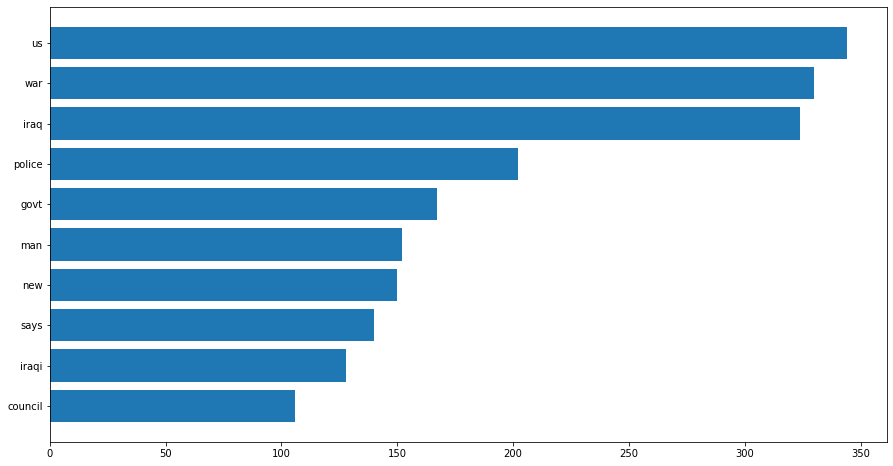

In [13]:
# create figure and axes
fig, ax = plt.subplots(figsize=(15,8))

# flip the bar chart from top to bottom
result = result[::-1]

# plot the barchart
ax.barh(result['word'],result['value'])

Looks quite similar to the demo, huh?

## Color and labels
<a id="color"></a>

In [14]:
# specify the year that we want to plot
current_year = 2003

Text(1, 0.15, '2003')

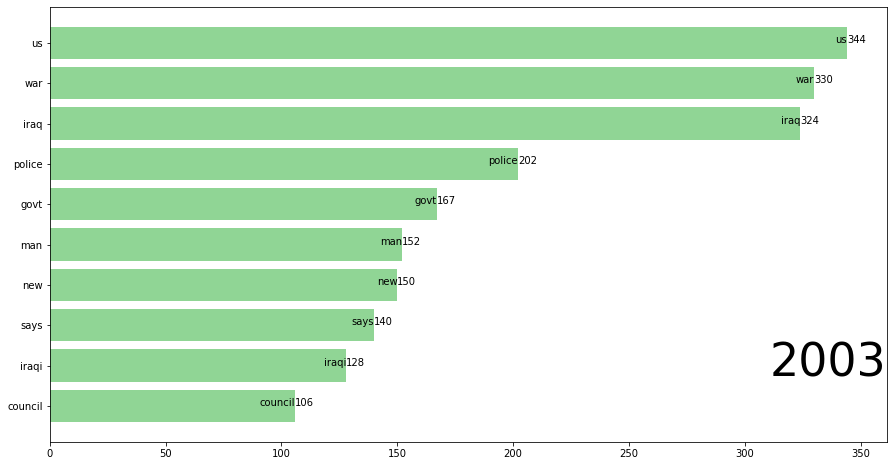

In [15]:
# create figure and axes
fig, ax = plt.subplots(figsize=(15,8))

# pass data
ax.barh(result['word'],result['value'], color='#90d595')

# iterate over the values to plot labels and values
for i, (value,name) in enumerate(zip(result['value'],result['word'])):
    ax.text(value,i,name,ha='right') 
    ax.text(value,i,value,ha='left') 
    
# Add year right bottom portion of canvas
ax.text(1,0.15,current_year,transform=ax.transAxes,size=46,ha='right')

## Polish style
<a id="style"></a>

We will follow a similar style as the one explained in the demo notebook.

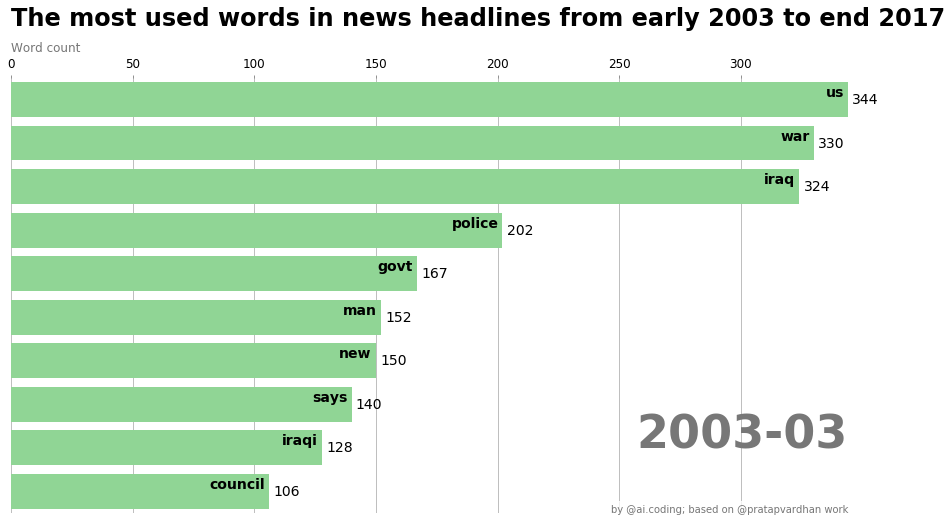

In [20]:
# create figure and axes
fig, ax = plt.subplots(figsize=(15,8))

def draw_barchart(yearmonth):
    year = yearmonth[0:4]
    month = yearmonth[4:6]
    data_trans = data[data['year+month'].eq(year+month)]['headline_text'].str.cat(sep=' ')
    split_data = data_trans.split()
    data_stop = [word for word in split_data if word not in stop_words]
    counterVar = Counter(data_stop)
    most_occur = counterVar.most_common(10)
    result = pd.DataFrame(most_occur,columns=['word','value'])
    result = result[::-1]
    ax.clear()
    ax.barh(result['word'],result['value'],color='#90d595')
    dx = result['value'].max() / 200
    for i, (value,name) in enumerate(zip(result['value'],result['word'])):
        ax.text(value-dx,i,name,size=14,weight=600,ha='right',va='bottom')
#         ax.text(value-dx,i-.25,group_lk[name],size=10,color='#444444',ha='right',va='baseline')
        ax.text(value+dx,i,f'{value:,.0f}',size=14,ha='left',va='center')
    ax.text(1,0.15,year+'-'+month,transform=ax.transAxes,color='#777777',size=46,ha='right',weight=800)
    ax.text(0,1.06,'Word count', transform=ax.transAxes,size=12,color="#777777")
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x',color='#777777',labelsize=12)
    ax.set_yticks([])
    ax.margins(0,0.01)
    ax.grid(which='major',axis='x',linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0,1.12,"The most used words in news headlines from early 2003 to end 2017",transform=ax.transAxes,size=24,weight=600,ha='left')
    ax.text(1,0,'by @ai.coding; based on @pratapvardhan work',transform=ax.transAxes,ha='right',color="#777777",bbox=dict(facecolor='white',alpha=0.8,edgecolor='white'))
    plt.box(False)

draw_barchart('200303')

## Animated race
<a id="race"></a>

It's tme to make cool animations now! So we will first get the range of months/years and then we will proceed to create or video using the list of months/years as input.

In [21]:
# get unique year+month
year_month = list(data['year+month'].unique())

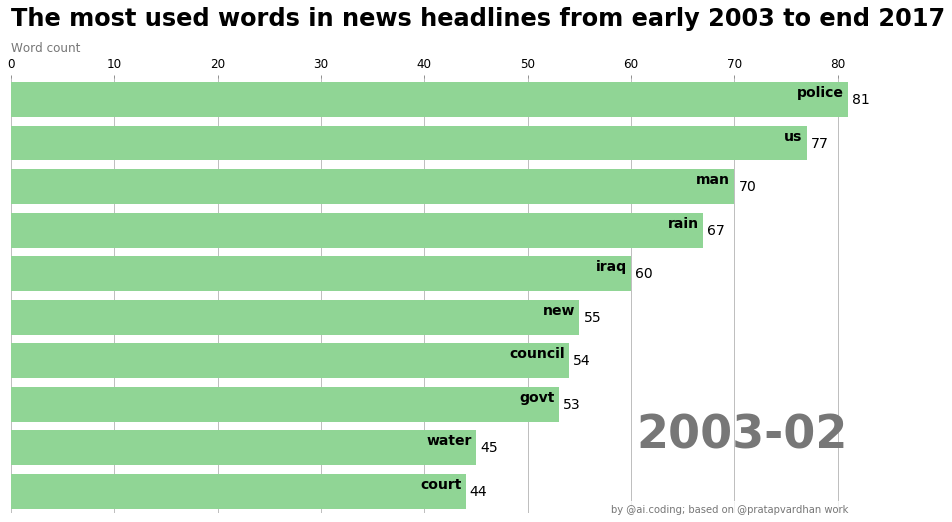

In [22]:
# create animation
fig, ax = plt.subplots(figsize=(15,8))
animator = animation.FuncAnimation(fig,draw_barchart,frames=year_month,interval=1000)
HTML(animator.to_jshtml())

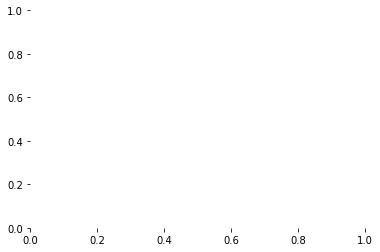

In [23]:
# save animation
animator.save('../Results/headlines2003-2017.mp4')